In [2]:
from main import *
from visualization import *

import bct
import hdbscan
from sklearn.manifold import TSNE
from scipy.stats import zscore

%matplotlib inline
plt.rcParams['font.size'] = 6

# Setting paths

In [5]:
top_directory = '/media/anleg84/Backup Plus/CERVO/Data/Networks2024/'
atlas_path = '/home/anleg84/Documents/Atlas/MapzebrainOld/'

In [6]:
atlas = MapzebrainAtlas(atlas_path)
centroids = np.concatenate([atlas.regionCentroids['left'], atlas.regionCentroids['right']], axis=0)
centroids[:, 1] = 974 - centroids[:, 1]

In [7]:
datasets = get_datasets(top_directory, keywords=['920nm'], exclude=[])
print(len(datasets))

22


In [8]:
W_dir = np.load('Results/directed_terminals_expanded.npy')
W_und = np.load('Results/undirected_terminals_expanded.npy')
FC = np.load('Results/FC_matrix.npy')

In [9]:
delete = delete_rows_and_columns

# Computing bilateral regional time series

To find modular coactivation patterns, we begin by computing regional calcium time series in both hemispheres.

In [10]:
compute = False

if compute:
    for folder in tqdm(datasets, file=sys.stdout):
        
        data = load_data(folder)
        dff = np.load(folder + 'dff.npy')
        left = data['centroids_atlas'][:, 0] <= 284
        right = data['centroids_atlas'][:, 0] > 284
        region_series = np.zeros((140, dff.shape[1]))
        for i in range(70):
            in_region = data['region_labels'][:, i] != 0
            if np.any(in_region & left):
                region_series[i] = np.mean(dff[in_region & left], axis=0)
            if np.any(in_region & right):
                region_series[i + 70] = np.mean(dff[in_region & right], axis=0)
    
        np.save(folder + 'region_series_dff_bilateral.npy', region_series)

# Loading bilateral time series and excluding regions

Then, we load regional time series, filter them slightly, exclude regions that aren't properly sampled across both hemispheres, detrend the time series, and finally z-score them.

In [11]:
sigma = 2
remove_global = False

rseries = []
for ds in datasets:
    rseries.append(np.load(ds + 'region_series_dff_bilateral.npy')[:, :])
    for i in range(rseries[-1].shape[0]):
        rseries[-1][i] = gaussian_filter1d(rseries[-1][i], sigma)

if rseries[-1].shape[0] == 140:
    excluded = np.unique(np.where(np.sum((np.sum(np.stack(rseries, axis=0), axis=2) == 0), axis=0) != 0)[0] % 70)
    excluded = np.unique(np.concatenate([[10], excluded]))
    excluded = np.concatenate([excluded, excluded + 70])
else:
    excluded = np.unique(np.where(np.sum((np.sum(np.stack(rseries, axis=0), axis=2) == 0), axis=0) != 0)[0] % 70)
    excluded = np.unique(np.concatenate([[10], excluded]))
    #excluded = np.concatenate([excluded, excluded + 70])

for i in range(len(rseries)):
    rseries[i] = np.delete(rseries[i], excluded, axis=0)

for i in range(len(rseries)):
    dff = compute_dff_using_minfilter(rseries[i],
                                          window=30,
                                          sigma1=3,
                                          sigma2=30)
    if remove_global:
        dff = remove_global_signal(dff)
    rseries[i] = zscore(dff, axis=1)

In [12]:
np.save('Results/figure4_excluded_regions_bilateral.npy', excluded)

# Activity matrix

Here, we visualize the concatenated regional activity of all animals

In [13]:
state_matrix = np.concatenate(rseries, axis=1)
R = state_matrix.shape[0]

save = True
if save:
    np.save('Results/figure4_state_matrix.npy', state_matrix)

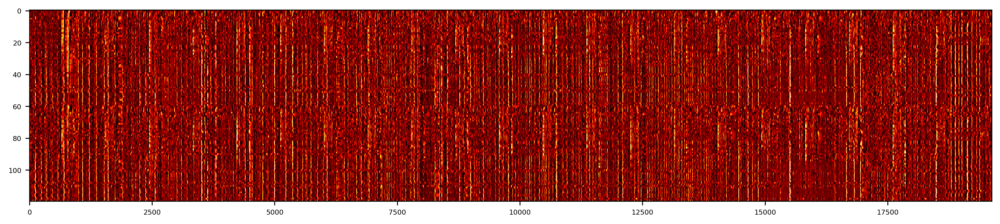

In [14]:
plt.figure(figsize=(15, 3), dpi=300)
plt.imshow(state_matrix, cmap='hot', aspect='auto', vmin=-1, vmax=4)

# Computing root-mean-square (RMS) of regional coactivations

Next, we use pairwise products of z-scored activity to find moments where brain regions are significantly coactivated.

In [15]:
def compute_RMS(timeseries):
    R = timeseries.shape[0]
    RMS = []
    for i in range(timeseries.shape[1]):
        c = timeseries[:, i]
        coactivation = c.reshape(R, 1) @ c.reshape(1, R)
        RMS.append(np.sqrt(np.mean(coactivation[np.triu_indices(R, 1)] ** 2)))
    return np.array(RMS)

In [16]:
RMS = compute_RMS(state_matrix)
np.save('Results/figure4_RMS.npy', RMS)

We define a null threshold by permuting time series and computing null RMS distributions.

In [17]:
compute = False

if compute:
    null_RMS_values = []
    for _ in tqdm(range(100), file=sys.stdout):
        permuted_rseries = []
        for ts in rseries:
            permuted_rseries.append(permute_timeseries(ts))
        null_state_matrix = np.concatenate(permuted_rseries, axis=1)
        null_RMS = compute_RMS(null_state_matrix)
        null_RMS_values.append(null_RMS)
    null_RMS = np.concatenate(null_RMS_values)
    np.save('Results/figure4_null_RMS_dist.npy', np.concatenate(null_RMS_values))
else:
    null_RMS_values = np.load('Results/figure4_null_RMS_dist.npy')

In [18]:
null_RMS_threshold = [np.percentile(null_RMS_values, 95)] * state_matrix.shape[1]
np.save('Results/figure4_RMS_threshold.npy', null_RMS_threshold)

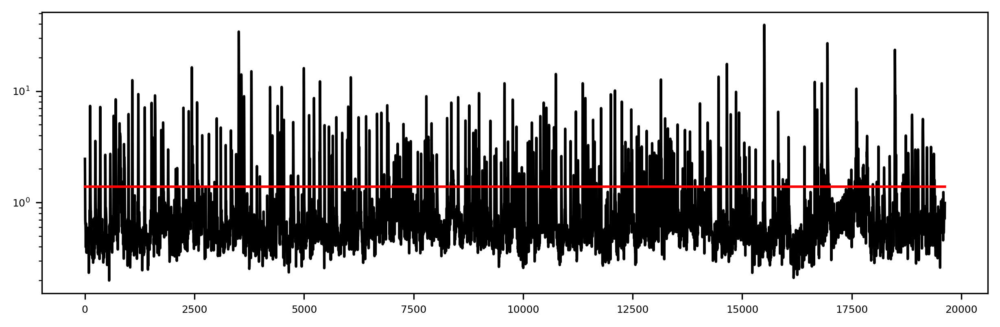

In [19]:
plt.figure(figsize=(10, 3), dpi=300)
plt.plot(RMS, color='black', label='RSS')
plt.plot(null_RMS_threshold, color='red', label='95th percentile null')
plt.yscale('log')
#plt.xlim([0, 2500])

# Identifying significant and contiguous events

In [20]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.stats import percentileofscore
import numpy as np
from statsmodels.stats.multitest import multipletests
from scipy.stats import zscore

Identifying events that exceed the null RMS threshold.

In [21]:
events = state_matrix[:, RMS > null_RMS_threshold]
print(events.shape[1])

2382


Correcting P-values (FDR correction).

In [22]:
p_values = []
for value in tqdm(RMS, file=sys.stdout):
    empirical_percentile = percentileofscore(null_RMS_values, value)
    p_values.append((100 - empirical_percentile) / 100)
p_values = np.array(p_values)

100%|████████████████████████████████████| 19624/19624 [00:46<00:00, 418.38it/s]


In [23]:
alpha = 0.05
adjusted_results = multipletests(p_values, alpha=alpha, method='fdr_bh')
adjusted_p_values = adjusted_results[1] 

In [24]:
np.sum(adjusted_p_values < 0.05)

1755

Merging contiguous significant frames into individual events.

In [25]:
plateaus = find_plateaus(adjusted_p_values < 0.05)

fish_ids = []
for i, ts in enumerate(rseries):
    fish_ids += [i] * ts.shape[1]
fish_ids = np.array(fish_ids)

new_plateaus = []
for p in plateaus:
    f = fish_ids[p > 0]
    if len(np.unique(f)) == 1:
        new_plateaus.append(p)
    else:
        plateau_vector = np.copy(p)
        plateau_vector[plateau_vector > 0] = f
        fish_in_plateau = np.unique(f)
        for fish in fish_in_plateau:
            new_plateaus.append(plateau_vector == fish)
plateaus = np.stack(new_plateaus, axis=0)

events = []
for p in plateaus:
    frames = state_matrix[:, p > 0]
    events.append(np.mean(frames, axis=1))
events = np.stack(events, axis=1)
print(events.shape[1])

243


In [26]:
np.save('Results/figure4_events_high.npy', events)

# Clustering high amplitude events

Next, we use dimensionality reduction and density-based clustering to find 3 clusters of high-amplitude activity.

In [27]:
events = np.load('Results/figure4_events_high.npy')

In [28]:
embedding = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=30, random_state=420).fit_transform(events.T)

clusterer = hdbscan.HDBSCAN(min_cluster_size=10)
clusterer.fit(embedding)
clusters = clusterer.labels_

cluster_centroids = []
for c in np.unique(clusters):
    if c != -1:
        centroid = np.mean(events[:, clusters == c], axis=1)
        cluster_centroids.append(centroid)

for i, c in enumerate(clusters):
    if c == -1:
        event = events[:, i]
        similarity = []
        for centroid in cluster_centroids:
            r = pearsonr(event, centroid)[0]
            similarity.append(r)
        clusters[i] = np.argmax(similarity)

cluster_centroids = []
for c in np.unique(clusters):
    if c != -1:
        centroid = np.mean(events[:, clusters == c], axis=1)
        cluster_centroids.append(centroid)

In [29]:
np.save('Results/figure4_clusters_events_high.npy', clusters)
np.save('Results/figure4_embedding_events_high.npy', embedding)

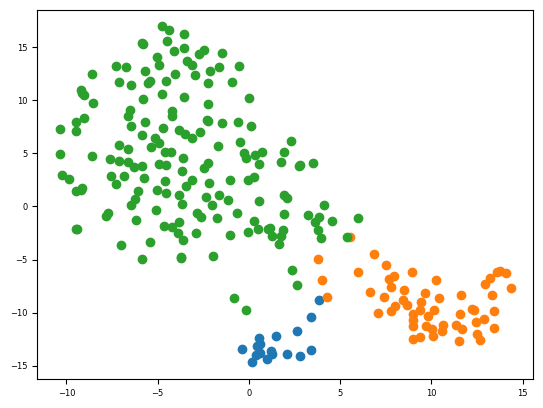

In [30]:
for c in np.unique(clusters):
    plt.scatter(embedding[clusters == c, 0], embedding[clusters == c, 1])

Correlation matrix of events.

In [31]:
correlations = compute_correlation_matrix(events.T)

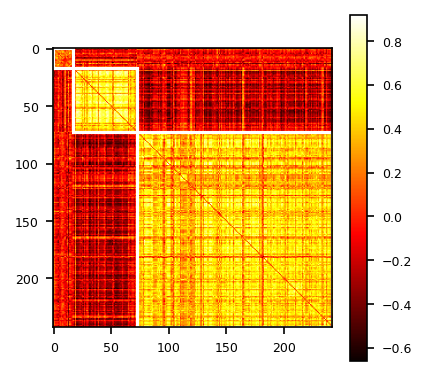

In [32]:
fig, ax = plt.subplots(figsize=(3, 3), dpi=150)
im = plot_matrix_communities(ax, correlations, clusters, linewidth=1.5, cmap='hot', edgecolor='white', output=True)
plt.colorbar(im, ax=ax)

Plotting event centroids.

Coactivation pattern 0


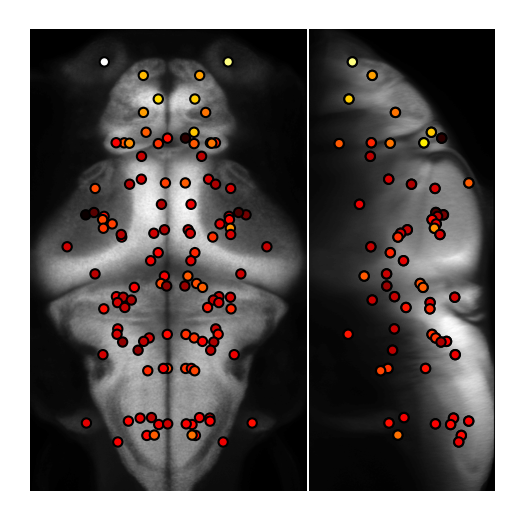

Coactivation pattern 1


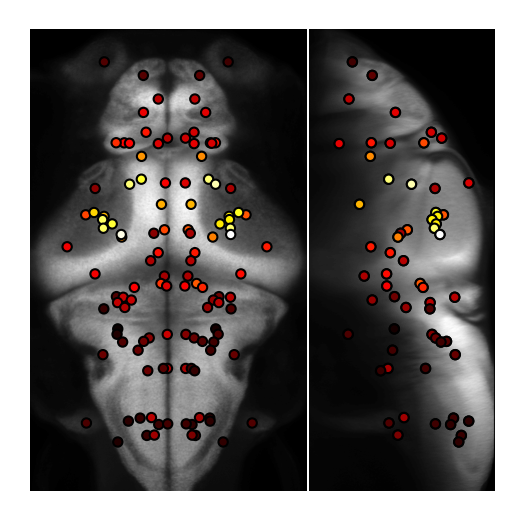

Coactivation pattern 2


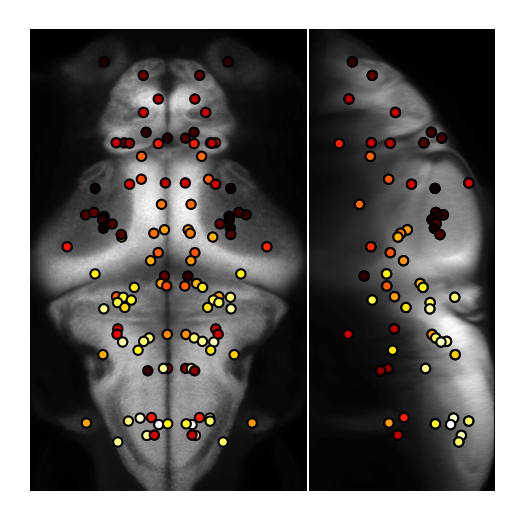

In [33]:
for i, cap in enumerate(cluster_centroids):

    print(f'Coactivation pattern {i}')
    plot_regional_values(cap, atlas, excluded=excluded, cmap='hot')
    %matplotlib inline

# Computing coactivations within communities

Here, we evaluate how different coactivation events align with structural modules.

In [34]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster, ward, leaves_list, set_link_color_palette
from brainsmash.mapgen.base import Base

def plot_surrogates(activation, distances, communities, n=10, resample=True):
    base = Base(x=activation, D=distances, resample=resample)
    surrogates = base(n=n)
    R = len(activation)
    cap = activation.reshape(R, 1) @ activation.reshape(1, R)
    surrogate_caps = []
    for s in surrogates:
        surrogate_caps.append(s.reshape(R, 1) @ s.reshape(1, R))

    fig, ax = plt.subplots(3, 5, figsize=(10, 7))
    v = np.percentile(np.abs(cap), 95)

    plot_matrix_communities(ax[0, 2], cap, communities, vmin=-v, vmax=v)
    for i, s in enumerate(surrogate_caps):
        a = ax.flatten()[i + 5]
        v = np.percentile(np.abs(s), 95)
        plot_matrix_communities(a, s, communities, vmin=-v, vmax=v)
    for i, a in enumerate(ax.flatten()):
        if i in [0, 1, 3, 4]:
            a.axis('off')
        else:
            a.set_xticks([])
            a.set_yticks([])
    plt.show()

def compute_mean_coactivation_per_module(vector, communities):
    V = vector.flatten()
    N = len(vector)
    matrix = V.reshape(N, 1) @ V.reshape(1, N)
    ids = np.argsort(communities)
    reordered_matrix = matrix[ids, :][:, ids]
    reordered_communities = communities[ids]
    mean_coactivation_per_module = []
    for c in np.unique(communities):
        block = reordered_matrix[reordered_communities == c, :][:, reordered_communities == c]
        mean_coactivation_per_module.append(np.mean(block))
    return mean_coactivation_per_module

def plot_significant_modules(coactivation_pattern, significant, communities, edgecolor='white'):
    R = coactivation_pattern.shape[0]
    if len(coactivation_pattern.shape) == 1:
        coactivation_pattern = coactivation_pattern.reshape(R, 1) @ coactivation_pattern.reshape(1, R)

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    v = np.percentile(np.abs(coactivation_pattern), 95)
    plot_matrix_communities(ax[0], coactivation_pattern, communities, vmin=-v, vmax=v)
    significant_modules1 = np.zeros(coactivation_pattern.shape)
    significant_modules2 = np.zeros(coactivation_pattern.shape)

    for i, s in enumerate(significant):
        if s:
            significant_modules1[communities == i + 1, :] = 1
            significant_modules2[:, communities == i + 1] = 1
    plot_matrix_communities(ax[1], significant_modules1 * significant_modules2, communities, vmin=0, vmax=1, cmap='gray', edgecolor=edgecolor)
    plt.show()

#### Generating surrogates for three clusters

To assess the significance of the spatial alignment between coactivations and SC modules, we generate surrogate coactivation patterns using `Brainsmash`, which randomizes activity while roughly preserving spatial autocorrelation (via preservation of the variogram). Note that the cluster ordering here differs from the ordering in the paper. Cluster 0 is forebrain, cluster 1 is visual, and cluster 2 is motor.

In [35]:
centroids = np.concatenate([atlas.regionCentroids['left'], atlas.regionCentroids['right']], axis=0)
centroids[:, 1] = 974 - centroids[:, 1]
centroids = np.delete(centroids, excluded, axis=0)

distances = compute_distances(centroids)

Cluster centroid 0 (weak forebrain cluster)

In [36]:
compute = False

if compute:
    base = Base(x=cluster_centroids[0], D=distances, resample=True)
    surrogates = []
    for _ in tqdm(range(10000), file=sys.stdout):
        surrogates.append(base(n=1))
    np.save('Results/figure4_surrogates_cluster0.npy', surrogates)

Cluster centroid 1 (visual cluster)

In [37]:
compute = False

if compute:
    base = Base(x=cluster_centroids[1], D=distances, resample=True)
    surrogates = []
    for _ in tqdm(range(10000), file=sys.stdout):
        surrogates.append(base(n=1))
    np.save('Results/figure4_surrogates_cluster1.npy', surrogates)

Cluster centroid 2 (motor cluster)

In [38]:
compute = False

if compute:
    base = Base(x=cluster_centroids[2], D=distances, resample=True)
    surrogates = []
    for _ in tqdm(range(10000), file=sys.stdout):
        surrogates.append(base(n=1))
    np.save('Results/figure4_surrogates_cluster2.npy', surrogates)

#### Validating modularity of event clusters

To evaluate the statistical significance of module coactivation, we compute the average coactivation value *per module*, and we compare these values with a null distribution generated by taking the maximal average coactivation scores of *any module* in spatial surrogates. For instance, a spatial surrogate of forebrain activity could have maximal shuffled coactivation values in a hindbrain module, and this value would contribute to the null distribution against the forebrain coactivation. Thus, by taking the maximally coactivated module of each spatial surrogate, we make the statistical test much harder, as the empirical coactivations in a specific module must beat the maximal null coactivations of all the modules simultaneously.

In [39]:
from scipy.stats import percentileofscore

In [40]:
coassignment_matrix_SC = np.load('Results/coassignment_matrix_SC_expanded.npy')
coassignment_matrix_SCCM = np.load('Results/coassignment_SCCM_expanded.npy')

#### Cluster 1 (Visual)

In [41]:
c = cluster_centroids[1]
surrogates = np.load('Results/figure4_surrogates_cluster1.npy')

100%|███████████████████████████████████| 10000/10000 [00:01<00:00, 7721.17it/s]


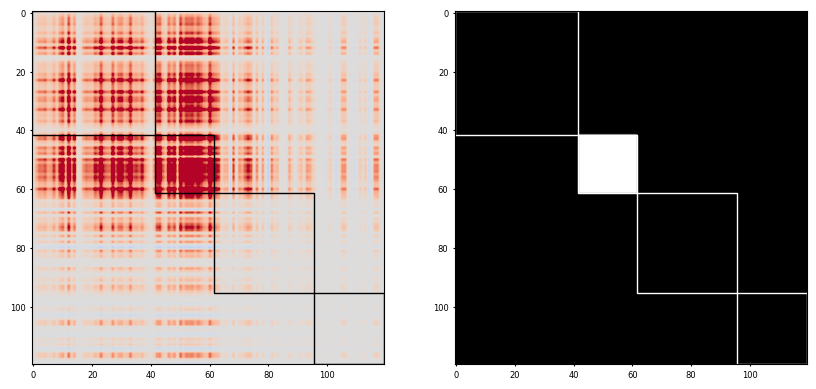

P-value: 0.008



In [42]:
coassignment_matrix = coassignment_matrix_SC

N_communities = 4

Z = linkage(1 - coassignment_matrix, 'ward')
ids_Z = np.flip(leaves_list(Z)).astype('int')
communities = reorder_clusters_anteroposterior(fcluster(Z, t=N_communities, criterion='maxclust'))
communities = np.delete(double(communities), excluded)

mean_coactivation = compute_mean_coactivation_per_module(c, communities)
null_coactivations = []
for s in tqdm(surrogates, file=sys.stdout):
    mean_null = compute_mean_coactivation_per_module(s, communities)
    null_coactivations.append(mean_null)
threshold = np.percentile(np.max(null_coactivations, axis=1), 95)
p_value = (100 - percentileofscore(np.max(null_coactivations, axis=1), np.max(mean_coactivation))) / 100
significant = mean_coactivation > threshold
plot_significant_modules(c, significant, communities, edgecolor='white')

print('P-value: {:.3f}\n'.format(p_value))

In [43]:
communities_shuffled = np.copy(communities)
mean_coactivations_shuffled = []
for _ in range(10000):
    np.random.shuffle(communities_shuffled)
    mean = compute_mean_coactivation_per_module(c, communities_shuffled)
    mean_coactivations_shuffled.append(mean)

In [44]:
max_brainsmash = np.max(np.array(null_coactivations), axis=1)
max_shuffled = np.max(np.array(mean_coactivations_shuffled), axis=1)

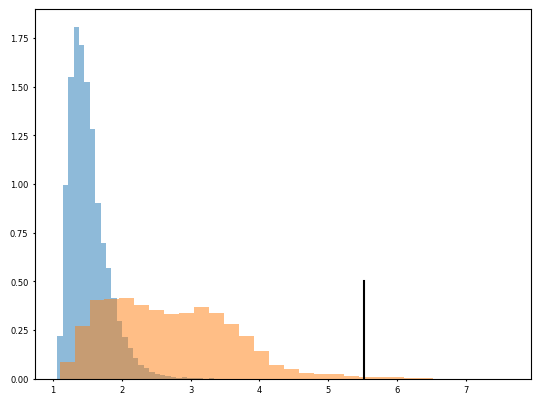

In [45]:
id = 1
plt.hist(max_shuffled, bins=30, density=True, alpha=0.5)
plt.hist(max_brainsmash, bins=30, density=True, alpha=0.5)
plt.plot([np.max(mean_coactivation), np.max(mean_coactivation)], [0, 0.5], color='black')
plt.show()

In [46]:
print(percentileofscore(max_brainsmash, np.max(mean_coactivation)))

99.19


In [57]:
np.save('Results/figure4_nulldist1_cluster1.npy', max_brainsmash)
np.save('Results/figure4_nulldist2_cluster1.npy', max_shuffled)
np.save('Results/figure4_empirical_cluster1.npy', np.max(mean_coactivation))

#### Cluster 2 (Motor)

In [58]:
c = cluster_centroids[2]
surrogates = np.load('Results/figure4_surrogates_cluster2.npy')

100%|███████████████████████████████████| 10000/10000 [00:01<00:00, 5535.92it/s]


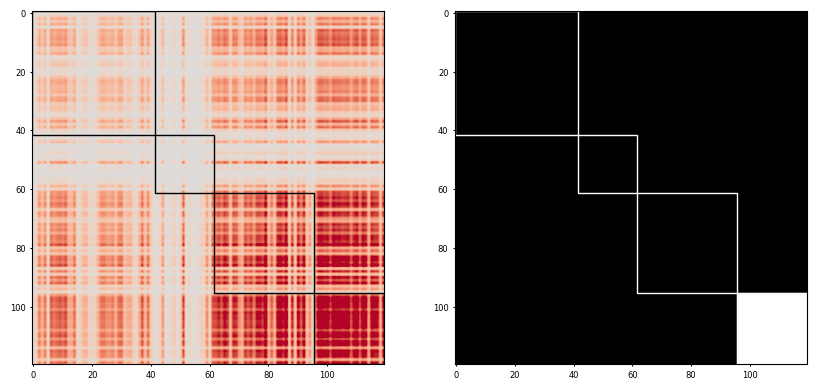

P-value: 0.015



In [59]:
coassignment_matrix = coassignment_matrix_SC

N_communities = 4 

Z = linkage(1 - coassignment_matrix, 'ward')
ids_Z = np.flip(leaves_list(Z)).astype('int')
communities = reorder_clusters_anteroposterior(fcluster(Z, t=N_communities, criterion='maxclust'))
communities = np.delete(double(communities), excluded)

mean_coactivation = compute_mean_coactivation_per_module(c, communities)
null_coactivations = []
for s in tqdm(surrogates, file=sys.stdout):
    mean_null = compute_mean_coactivation_per_module(s, communities)
    null_coactivations.append(mean_null)
threshold = np.percentile(np.max(null_coactivations, axis=1), 95)
p_value = (100 - percentileofscore(np.max(null_coactivations, axis=1), np.max(mean_coactivation))) / 100
significant = mean_coactivation > threshold
plot_significant_modules(c, significant, communities, edgecolor='white')

print('P-value: {:.3f}\n'.format(p_value))

In [60]:
communities_shuffled = np.copy(communities)
mean_coactivations_shuffled = []
for _ in range(10000):
    np.random.shuffle(communities_shuffled)
    mean = compute_mean_coactivation_per_module(c, communities_shuffled)
    mean_coactivations_shuffled.append(mean)

In [61]:
max_brainsmash = np.max(np.array(null_coactivations), axis=1)
max_shuffled = np.max(np.array(mean_coactivations_shuffled), axis=1)

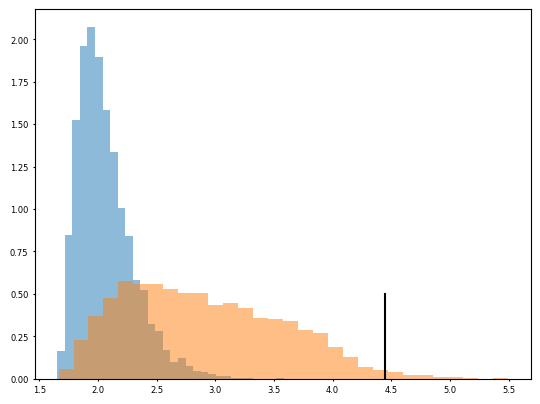

In [62]:
id = 1
plt.hist(max_shuffled, bins=30, density=True, alpha=0.5)
plt.hist(max_brainsmash, bins=30, density=True, alpha=0.5)
plt.plot([np.max(mean_coactivation), np.max(mean_coactivation)], [0, 0.5], color='black')
plt.show()

In [65]:
print(percentileofscore(max_brainsmash, np.max(mean_coactivation)))

98.52


In [63]:
np.save('Results/figure4_nulldist1_cluster2.npy', max_brainsmash)
np.save('Results/figure4_nulldist2_cluster2.npy', max_shuffled)
np.save('Results/figure4_empirical_cluster2.npy', np.max(mean_coactivation))

In [64]:
np.save('Results/figure4_consensus_communities_SC.npy', communities)

# Rendering coactivation patterns

Here, we return to the raw data and use ANTs registration to transform individual calcium imaging volumes, corresponding to frames belonging to coactivation clusters, into atlas referential. Then, we average these to yield a single representative volume corresponding to the average coactivation state across fish.

In [52]:
from calimba.analysis.data import *

In [53]:
import numpy as np
from scipy.ndimage import convolve
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import cv2

def filter_timeseries(timeseries, sigma=2):
    filtered = np.zeros(timeseries.shape)
    for i in range(timeseries.shape[0]):
        filtered[i] = gaussian_filter1d(timeseries[i], sigma)
    return filtered

In [54]:
def get_registration_folders(top_directory, keywords=['Wholebrain']):
    piezo_reg_folders, stack_reg_folders = [], []
    folders = identify_folders(top_directory, keywords=keywords)
    for folder in folders:
        piezo_folder = identify_folders(folder, ['Registration-Piezo'])[0]
        piezo_reg_folders += identify_folders(piezo_folder, ['fish'])
        stack_folder = identify_folders(folder, ['Registration-Atlas'])[0]
        stack_reg_folders += identify_folders(stack_folder, ['fish'])
    return piezo_reg_folders, stack_reg_folders

In [55]:
reg_piezo_folders, reg_stack_folders = get_registration_folders(top_directory)

In [36]:
path_ANTs = '/home/anleg84/Documents/ANTs/bin/'
os.environ["PATH"] += os.pathsep + path_ANTs

In [37]:
cluster_paths = []
for c in np.unique(clusters):
    cluster_paths.append(top_directory + 'Clusters-Mapzebrain/ClusterHigh{}/'.format(c + 1))

In [38]:
cluster_plateaus = np.copy(plateaus).astype('int')
for i, c in enumerate(clusters):
    cluster_plateaus[i][cluster_plateaus[i] > 0] = c + 1
#np.save('Results/figure4_cluster_plateaus.npy', cluster_plateaus)

In [39]:
for c in np.unique(clusters):

    frame_vector = np.sum(cluster_plateaus[clusters == c], axis=0) > 0
    
    for fish in tqdm(np.unique(fish_ids), file=sys.stdout):
        
        directory = cluster_paths[c]
        nrrd_header = load_stack(reg_piezo_folders[fish] + 'piezo.nrrd')[1]
    
        frame_ids = np.where(frame_vector[fish_ids == fish])[0]
        if np.any(frame_ids):
            folder = datasets[fish]
            file = identify_files(folder, ['piezo', '.nrrd'])[0]
            piezo_stack = load_stack(folder + file)[0].astype('float')
            volumes = load_volumes(folder, frame_ids, keywords=['dff_corrected_', '.tif'], exclude=[])
            
        save_stack(directory + 'fish{}.nrrd'.format(fish), np.mean(volumes, axis=0), nrrd_header)
        
        os.chdir(directory)
        
        file_in = 'fish{}.nrrd'.format(fish)
        file_out = 'fish{}_stack.nrrd'.format(fish)
        path_to_transforms = reg_piezo_folders[fish]
        path_to_transforms = os.path.relpath(path_to_transforms, directory) + '/'
        
        os.system('antsApplyTransforms -d 3 --interpolation Linear -i {0} -o {1} -r {2}stack.nrrd -t {2}1Warp.nii.gz -t {2}0GenericAffine.mat'.format(
                        file_in, file_out, path_to_transforms))
        
        file_in = 'fish{}_stack.nrrd'.format(fish)
        file_out = 'fish{}_atlas.nrrd'.format(fish) 
        path_to_transforms = reg_stack_folders[fish]
        path_to_transforms = os.path.relpath(path_to_transforms, directory) + '/'
        
        os.system('antsApplyTransforms -d 3 --interpolation Linear -i {0} -o {1} -r {2}atlas.nrrd -t {2}1Warp.nii.gz -t {2}0GenericAffine.mat'.format(
                        file_in, file_out, path_to_transforms))
        
        os.remove(directory + 'fish{}.nrrd'.format(fish))
        os.remove(directory + 'fish{}_stack.nrrd'.format(fish))

100%|███████████████████████████████████████████| 22/22 [17:47<00:00, 48.53s/it]


centroid_frames = []
for c in np.unique(clusters):
    frame_vector = np.sum(cluster_plateaus[clusters == c], axis=0) > 0
    frames = []
    for fish in tqdm(np.unique(fish_ids), file=sys.stdout):
        frame_ids = np.where(frame_vector[fish_ids == fish])[0]
        if np.any(frame_ids):
            folder = datasets[fish]
            file = identify_files(folder, ['piezo', '.nrrd'])[0]
            piezo_stack = load_stack(folder + file)[0].astype('float')
            volumes = load_volumes(folder, frame_ids, keywords=['corrected_', '.tif'])
            volumes_mean = np.tile(np.expand_dims(piezo_stack, axis=0), (volumes.shape[0], 1, 1, 1))
            subtracted = volumes - volumes_mean        
        frame = np.mean(subtracted, axis=(0, 1))
        frames.append(frame)
    stack = np.stack(frames, axis=0)
    centroid_frames.append(np.mean(stack, axis=0))

In [41]:
shape = (180, 974, 597)

100%|███████████████████████████████████████████| 22/22 [01:55<00:00,  5.24s/it]


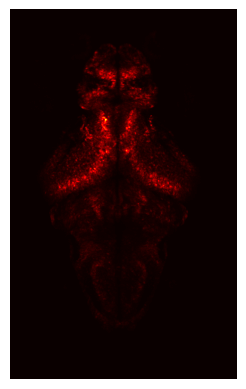

In [42]:
for c in np.unique(clusters):
    if c == 1:

        directory = cluster_paths[c]
        files = identify_files(directory, ['atlas', '.nrrd'])
        stack = np.zeros(shape).astype('float')
        for i in tqdm(range(len(files)), file=sys.stdout):
            new_stack, header = load_stack(directory + files[i])
            stack = (i / (i + 1)) * stack + (1 / (i + 1)) * new_stack.astype('float') # Running average
        
        save_stack(directory + 'average.nrrd', stack, header)

# Studying smaller amplitude patterns

Here, we move beyond the high-amplitude clustering approach and focus on small-amplitude frames. That is, we exclude high-amplitude frames identified previously, and we search for other significantly modular activity patterns.

In [110]:
def get_size_MB(object):
    return sys.getsizeof(object) / 1e6

In [111]:
trim_frames = np.zeros((len(fish_ids), ))
for f in np.unique(fish_ids):
    vec = trim_frames[fish_ids == f]
    vec[:60] = 1
    vec[630:] = 1
    trim_frames[fish_ids == f] = vec

large_amplitude_frames = np.sum(plateaus, axis=0)

excluded_frames = np.where((trim_frames + large_amplitude_frames) > 0)[0]

state_matrix_low = np.delete(state_matrix, excluded_frames, axis=1)
fish_ids_low = np.delete(fish_ids, excluded_frames)

In [112]:
np.save('Results/figure4_high_amplitude_frame_vector.npy', excluded_frames)

In [113]:
fish_ids_frames = []
for fish in np.unique(fish_ids):
    vec = fish_ids[fish_ids == fish]
    fish_ids_frames.append(np.arange(len(vec)))
fish_ids_frames = np.concatenate(fish_ids_frames)

fish_ids_frames_low = np.delete(fish_ids_frames, excluded_frames)

Plotting the remaining low-amplitude frames.

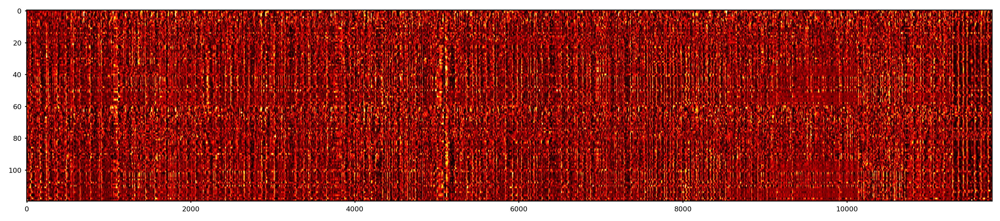

In [114]:
plt.figure(figsize=(15, 3), dpi=300)
plt.imshow(state_matrix_low, cmap='hot', aspect='auto', vmin=-1, vmax=3)

In [115]:
np.save('Results/figure4_supp_state_matrix_low.npy', state_matrix_low)

#### Consensus K-Means

We now use consensus K-Means clustering to identify clusters of low-amplitude coactivation patterns.

In [116]:
def compute_coassignment_probability_kmeans(data, N_iters=1000, k_min=2, k_max=30, threshold=False):
   
    k = np.linspace(k_min, k_max, N_iters, endpoint=True).astype('int')
    clusters = np.zeros((data.shape[0], N_iters))

    for i in tqdm(range(N_iters), file=sys.stdout):
        clustering = KMeans(n_clusters=k[i]).fit(data)
        clusters[:, i] =  clustering.labels_

    coassignment_matrix = compute_consensus_matrix_from_labels(clusters)

    if threshold:
        communities_null = shuffle_communities(clusters)
        coassignment_matrix_null = compute_consensus_matrix_from_labels(communities_null)
        coassignment_matrix -= np.mean(coassignment_matrix_null)
        coassignment_matrix[coassignment_matrix < 0] = 0

    return coassignment_matrix

def compute_clusters_cohesion(matrix, clusters):
    cohesions = []
    for c in np.unique(clusters):
        block = matrix[clusters == c, :][:, clusters == c]
        triangle = np.triu_indices(block.shape[0], 1)
        cohesions.append(np.mean(block[triangle]))
    return cohesions

def compute_intercluster_cohesion(matrix, clusters):
    cohesions = []
    for c1 in np.unique(clusters):
        for c2 in np.unique(clusters):
            if c1 != c2:
                block = matrix[clusters == c1, :][:, clusters == c2]
                cohesions.append(block.flatten())
    return np.concatenate(cohesions)

def reorder_clusters_by_criterion(clusters, criterion):
    new_clusters = np.copy(clusters)
    order = np.flip(np.argsort(criterion))
    for i, c in enumerate(order):
        new_clusters[clusters == c] = i
    return new_clusters

In [117]:
compute = False
if compute:
    consensus = compute_coassignment_probability_kmeans(state_matrix_low.T, k_max=30, N_iters=500)
    np.save('Results/figure4_low_amplitude_consensus.npy', consensus)
else:
    consensus = np.load('Results/figure4_low_amplitude_consensus.npy')

In [118]:
compute = False
if compute:
    Z = linkage(1 - consensus, 'ward')
    save_with_pickle('Results/figure4_low_amplitude_dendrogram.npy', Z)
else:
    Z = load_with_pickle('Results/figure4_low_amplitude_dendrogram.npy')

Computing the silhouette score on the consensus probabilities to find an optimal number of clusters.

In [119]:
N_clusters = np.arange(2, 31)

compute = False
if compute:
    silhouette_scores = []
    for t in tqdm(N_clusters, file=sys.stdout):
        clusters = reorder_clusters_anteroposterior(fcluster(Z, t=t, criterion='maxclust'))
        s = silhouette_score(consensus, clusters)
        silhouette_scores.append(s)
    np.save('Results/figure4_silhouette_scores.npy', silhouette_scores)
else:
    silhouette_scores = np.load('Results/figure4_silhouette_scores.npy')

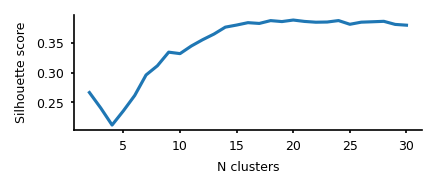

In [120]:
fig, ax = plt.subplots(figsize=(3, 1), dpi=150)
plt.plot(N_clusters, silhouette_scores)
plt.xlabel('N clusters')
plt.ylabel('Silhouette score')
ax.spines[['top', 'right']].set_visible(False)

In [121]:
N_opt = N_clusters[np.argmax(silhouette_scores)]
print(N_opt)

20


Plotting the consensus clustering matrix.

In [122]:
clusters = fcluster(Z, t=N_opt, criterion='maxclust')

In [123]:
np.save('Results/figure4_supp_clusters.npy', clusters)

In [124]:
clusters_vector_low = np.ones((state_matrix.shape[1], )) * -1
excluded_vector = np.zeros((state_matrix.shape[1], ))
excluded_vector[excluded_frames] = 1
clusters_vector_low[np.logical_not(excluded_vector)] = clusters

In [125]:
np.save('Results/figure4_clusters_vector_low_amplitude.npy', clusters_vector_low)

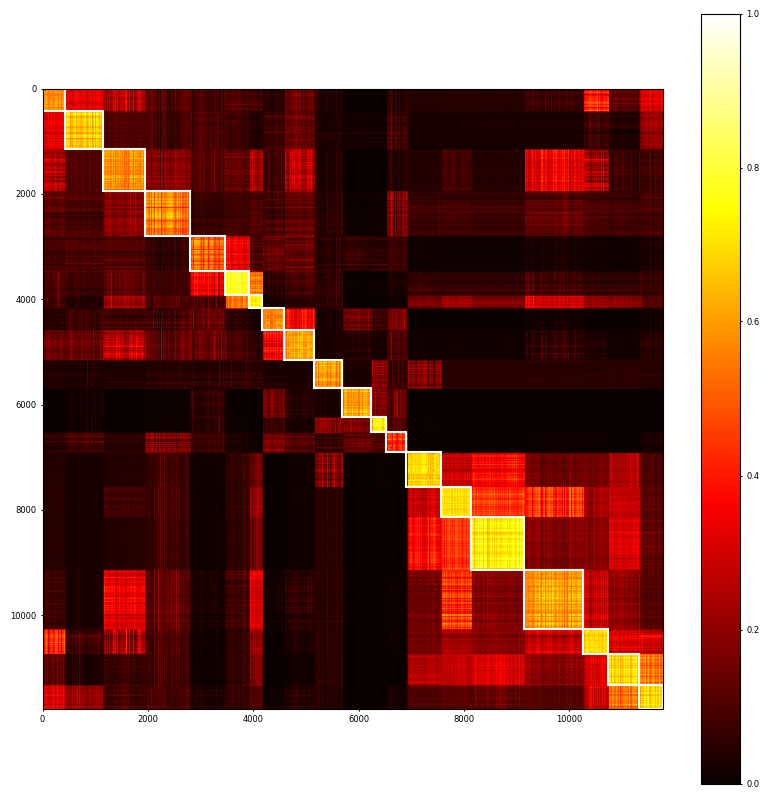

In [126]:
fig, ax = plt.subplots(figsize=(10, 10))
im = plot_matrix_communities(ax, consensus, clusters, linewidth=1.5, cmap='hot', edgecolor='white', output=True)
plt.colorbar(im, ax=ax)

Plotting cluster centroids.

In [127]:
cluster_centroids = []
for c in np.unique(clusters):
    if c != -1:
        centroid = np.mean(state_matrix_low[:, clusters == c], axis=1)
        cluster_centroids.append(centroid)

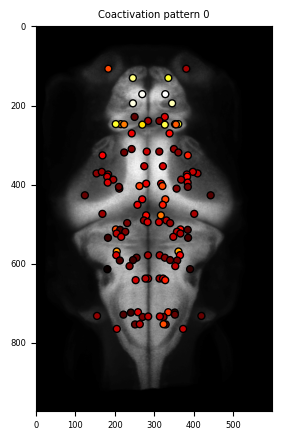

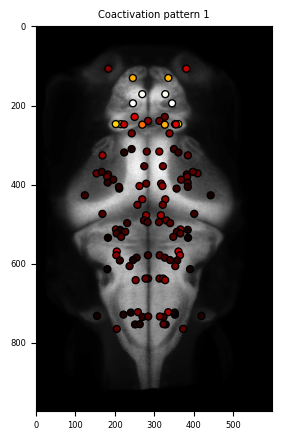

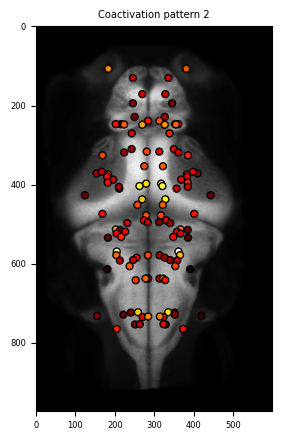

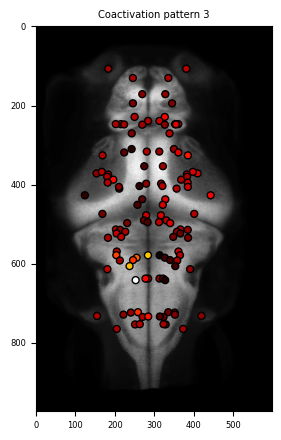

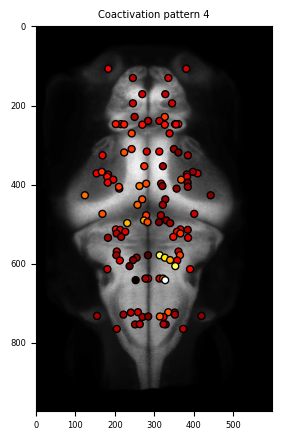

...

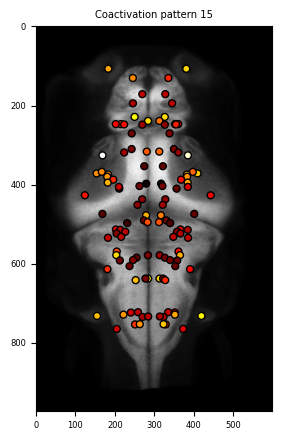

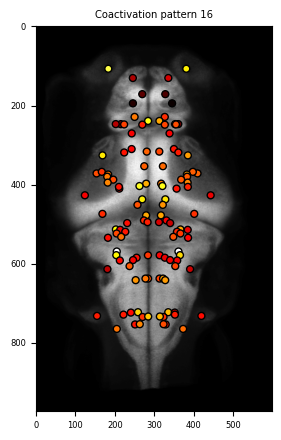

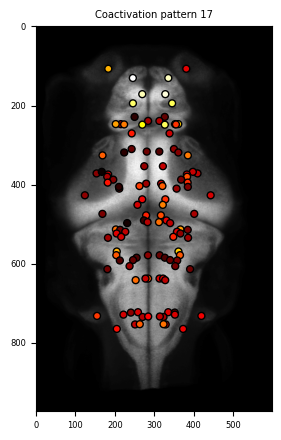

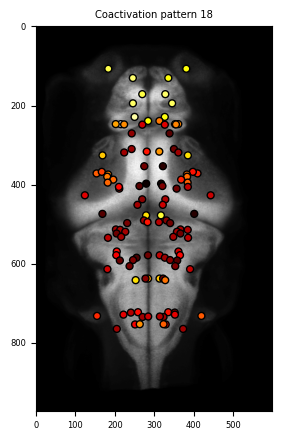

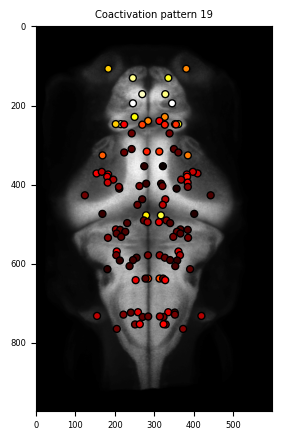

In [78]:
for i, cap in enumerate(cluster_centroids):
    fig, ax = plt.subplots(figsize=(5, 5))
    plot_node_values(ax, cap, atlas, excluded=excluded)
    plt.title(f'Coactivation pattern {i}')
    plt.show()

In [90]:
normalized_centroids = []
for c in cluster_centroids:
    v = np.copy(c)
    v -= np.min(v)
    v /= np.max(v)
    normalized_centroids.append(v)

plt.imshow(get_coactivation(cluster_centroids[0], normalize=True), cmap='magma')

# Modularity of low-amplitude states

Using the same statistical approach as earlier, we identify low-amplitude clusters that are significantly contained within modules of the SC.

In [128]:
N_surrogates = 1000

  0%|                                                    | 0/20 [00:00<?, ?it/s]

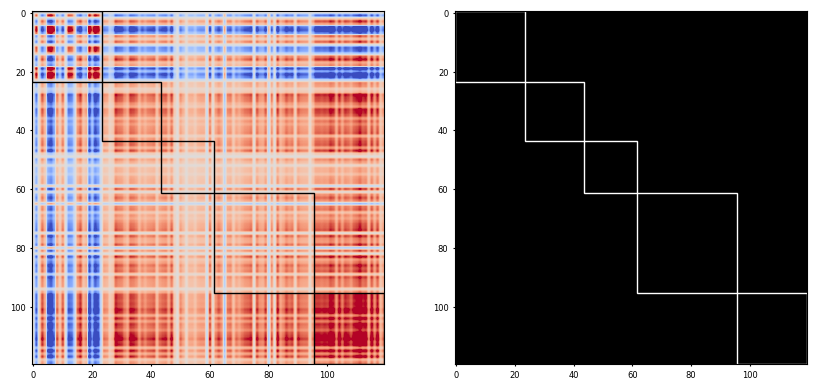

P-value: 0.089

  5%|██▏                                         | 1/20 [00:40<12:55, 40.80s/it]

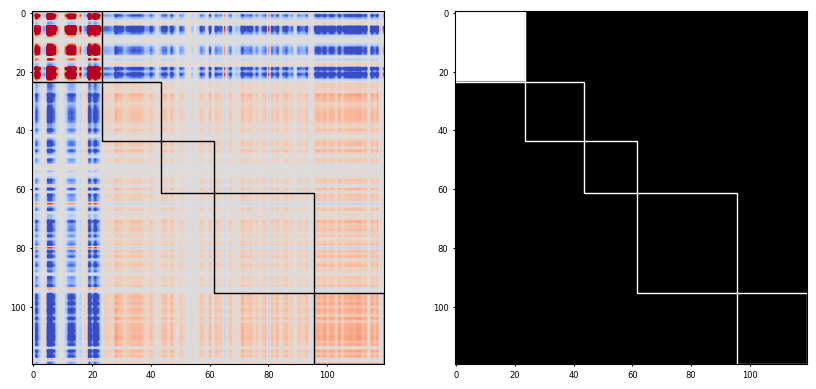

P-value: 0.016

 10%|████▍                                       | 2/20 [01:17<11:30, 38.35s/it]

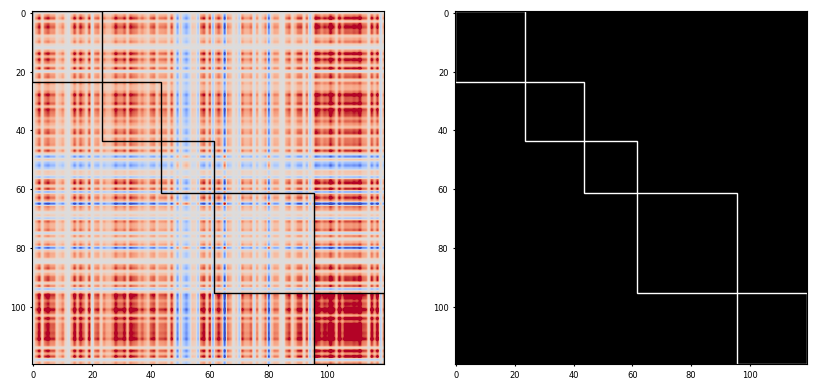

P-value: 0.230

 15%|██████▌                                     | 3/20 [01:57<11:05, 39.13s/it]

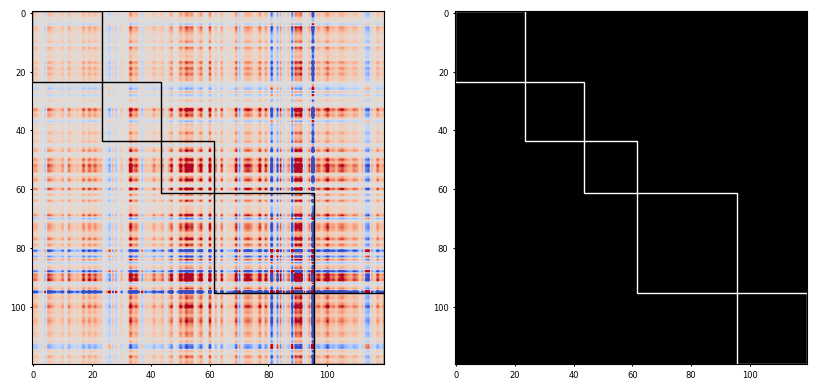

P-value: 0.779

 20%|████████▊                                   | 4/20 [02:36<10:25, 39.10s/it]

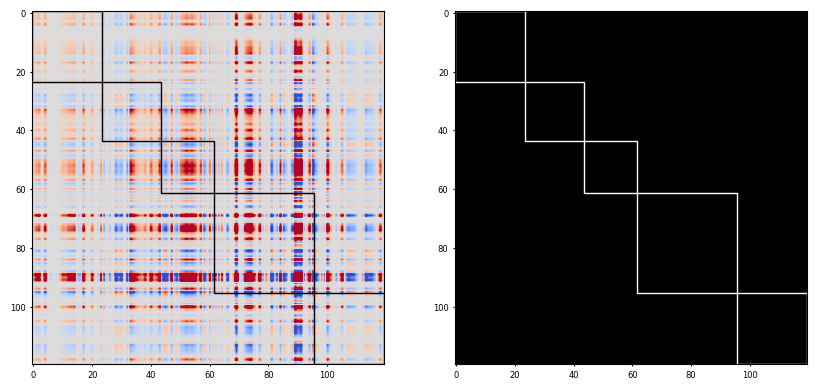

P-value: 0.930

 25%|███████████                                 | 5/20 [03:17<09:54, 39.61s/it]

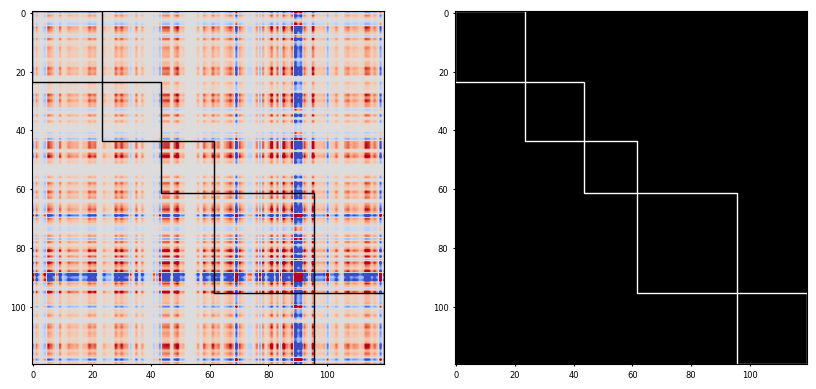

P-value: 0.888

 30%|█████████████▏                              | 6/20 [04:05<09:57, 42.69s/it]

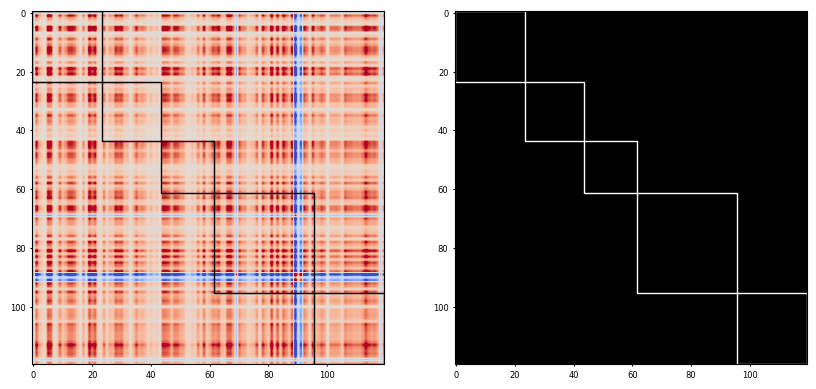

P-value: 0.989

 35%|███████████████▍                            | 7/20 [04:56<09:48, 45.26s/it]

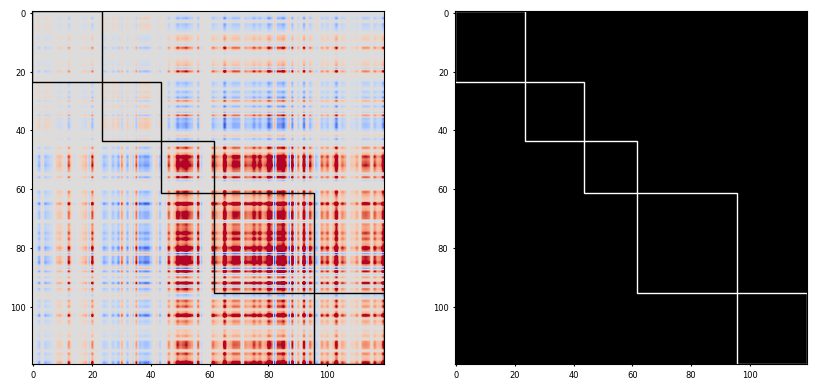

P-value: 0.548

 40%|█████████████████▌                          | 8/20 [05:52<09:43, 48.60s/it]

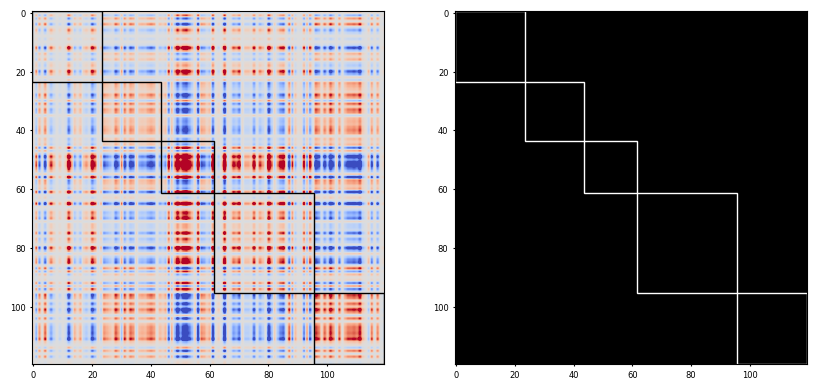

P-value: 0.563

 45%|███████████████████▊                        | 9/20 [06:43<09:05, 49.55s/it]

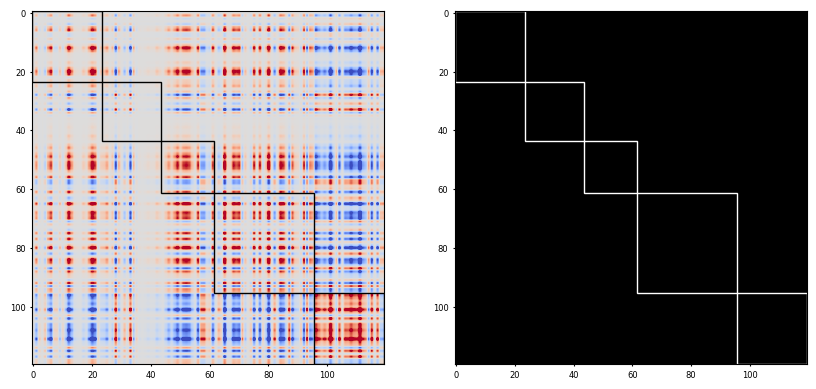

P-value: 0.415

 50%|█████████████████████▌                     | 10/20 [07:36<08:24, 50.50s/it]

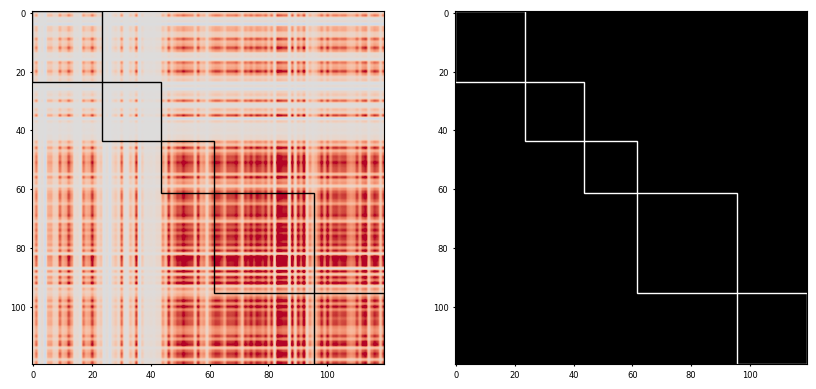

P-value: 0.600

 55%|███████████████████████▋                   | 11/20 [08:28<07:40, 51.16s/it]

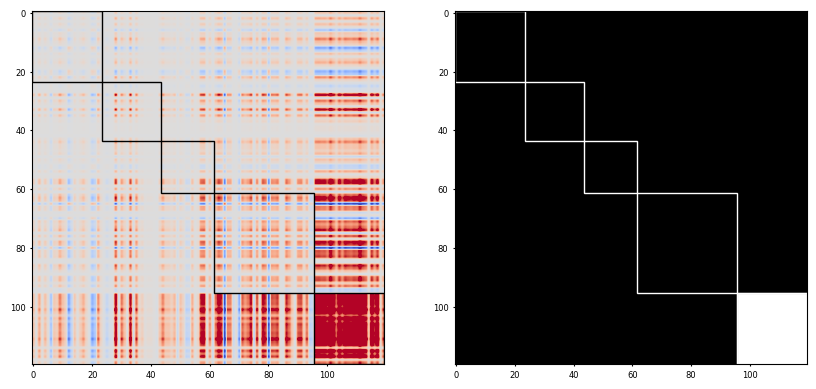

P-value: 0.037

 60%|█████████████████████████▊                 | 12/20 [09:09<06:23, 47.89s/it]

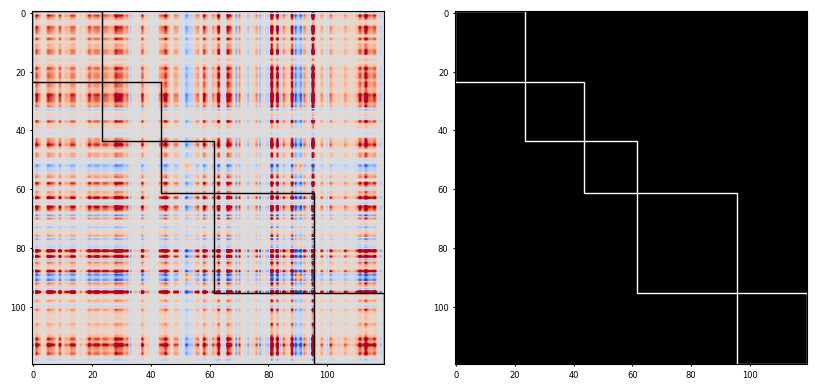

P-value: 0.980

 65%|███████████████████████████▉               | 13/20 [09:47<05:15, 45.01s/it]

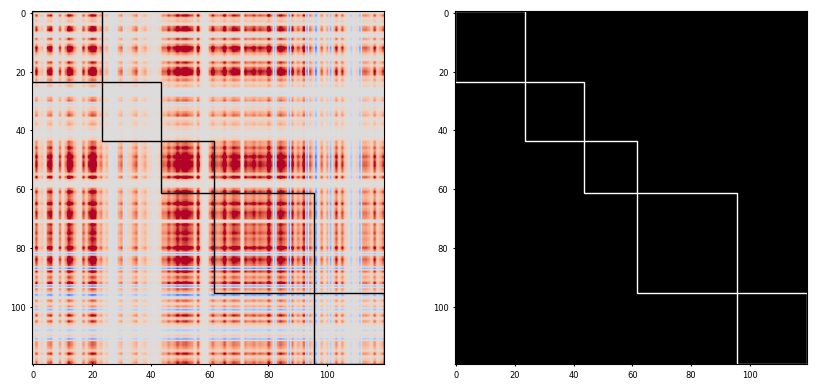

P-value: 0.630

 70%|██████████████████████████████             | 14/20 [10:24<04:15, 42.59s/it]

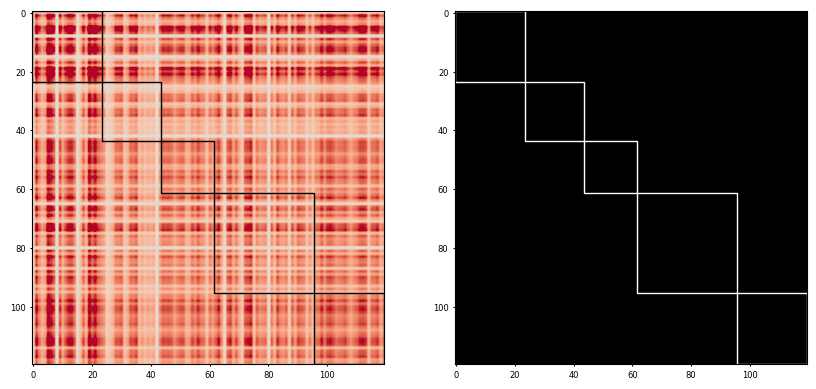

P-value: 0.849

 75%|████████████████████████████████▎          | 15/20 [11:00<03:22, 40.54s/it]

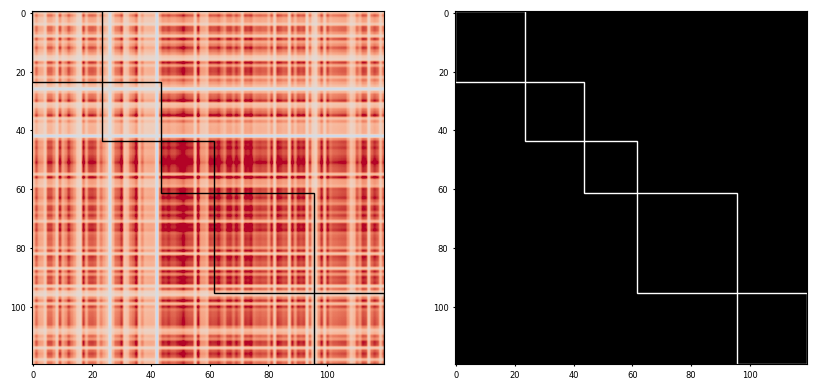

P-value: 0.537

 80%|██████████████████████████████████▍        | 16/20 [11:42<02:44, 41.05s/it]

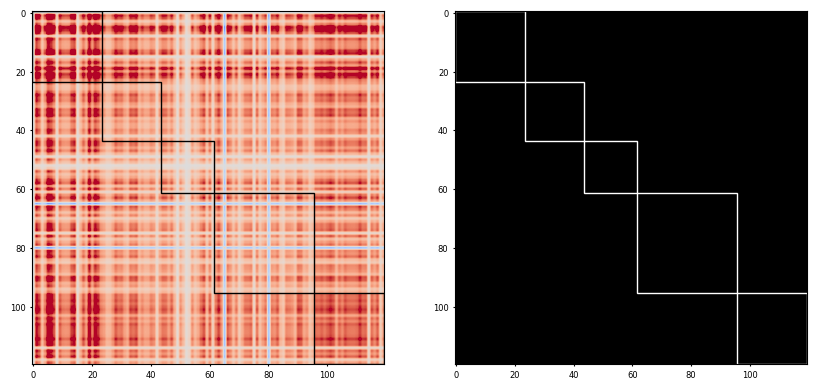

P-value: 0.541

 85%|████████████████████████████████████▌      | 17/20 [12:23<02:02, 40.87s/it]

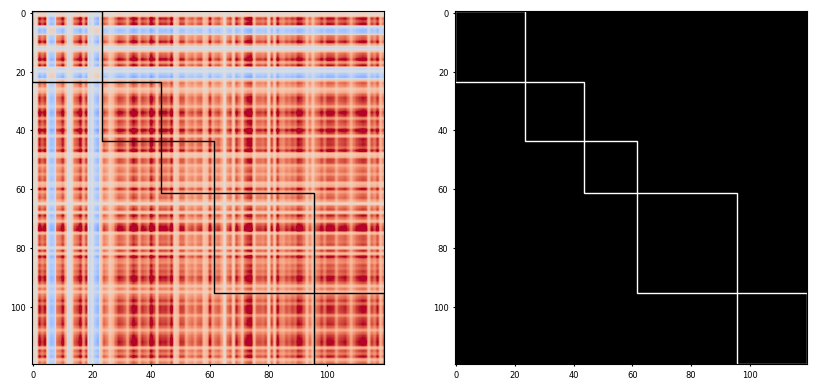

P-value: 0.795

 90%|██████████████████████████████████████▋    | 18/20 [13:10<01:25, 42.77s/it]

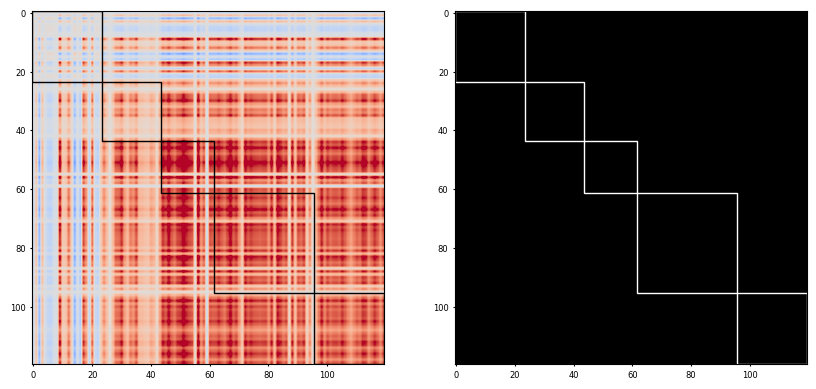

P-value: 0.558

 95%|████████████████████████████████████████▊  | 19/20 [14:01<00:45, 45.33s/it]

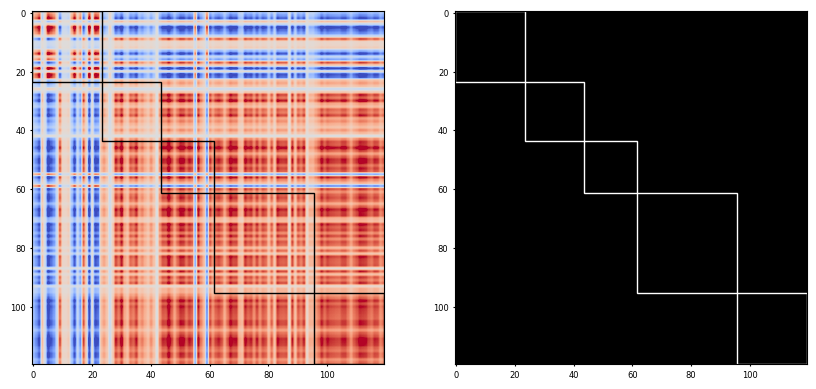

P-value: 0.384

100%|███████████████████████████████████████████| 20/20 [14:42<00:00, 44.10s/it]


In [129]:
max_coactivations, max_coactivations_null = [], []

for c in tqdm(cluster_centroids, file=sys.stdout):
    
    base = Base(x=c, D=distances, resample=True)
    surrogates = []
    for _ in range(N_surrogates):
        surrogates.append(base(n=1))

    coassignment_matrix = coassignment_matrix_SC

    N_communities = 5
    
    Z = linkage(1 - coassignment_matrix, 'ward')
    ids_Z = np.flip(leaves_list(Z)).astype('int')
    communities = reorder_clusters_anteroposterior(fcluster(Z, t=N_communities, criterion='maxclust'))
    communities = np.delete(double(communities), excluded)
    
    mean_coactivation = compute_mean_coactivation_per_module(c, communities)
    null_coactivations = []
    for s in surrogates:
        mean_null = compute_mean_coactivation_per_module(s, communities)
        null_coactivations.append(mean_null)
    threshold = np.percentile(np.max(null_coactivations, axis=1), 95)
    p_value = (100 - percentileofscore(np.max(null_coactivations, axis=1), np.max(mean_coactivation))) / 100
    significant = mean_coactivation > threshold
    plot_significant_modules(c, significant, communities, edgecolor='white')
    
    print('P-value: {:.3f}\n'.format(p_value))

    max_coactivations.append(np.max(mean_coactivation))
    max_coactivations_null.append(np.max(null_coactivations, axis=1))

In [131]:
np.save('Results/figure4_supp_max_coactivations_low.npy', max_coactivations)
np.save('Results/figure4_supp_max_coactivations_low_null.npy', max_coactivations_null)

# Rendering low-amplitude activation cluster centroids

Here we render in brain atlas the different low-amplitude cluster centroids. This is not shown in the paper and was mostly just for validation/visualization purposes.

In [60]:
from calimba.analysis.data import *

In [61]:
cluster_paths = []
for c in np.unique(clusters):
    cluster_paths.append(top_directory + 'Clusters-Mapzebrain/Cluster{}/'.format(c))

In [62]:
def get_registration_folders(top_directory, keywords=['Wholebrain']):
    piezo_reg_folders, stack_reg_folders = [], []
    folders = identify_folders(top_directory, keywords=keywords)
    for folder in folders:
        piezo_folder = identify_folders(folder, ['Registration-Piezo'])[0]
        piezo_reg_folders += identify_folders(piezo_folder, ['fish'])
        stack_folder = identify_folders(folder, ['Registration-Atlas'])[0]
        stack_reg_folders += identify_folders(stack_folder, ['fish'])
    return piezo_reg_folders, stack_reg_folders

In [63]:
reg_piezo_folders, reg_stack_folders = get_registration_folders(top_directory)

In [68]:
path_ANTs = '/home/anleg84/Documents/ANTs/bin/'
os.environ["PATH"] += os.pathsep + path_ANTs

In [ ]:
for c in np.unique(clusters):

    if c > 1:
    
        for fish in tqdm(np.unique(fish_ids), file=sys.stdout):
        
            #print('Fish {}'.format(fish))
            directory = cluster_paths[c - 1]
            nrrd_header = load_stack(reg_piezo_folders[fish] + 'piezo.nrrd')[1]
        
            #print('Loading volumes...')
            frame_ids = fish_ids_frames[fish_ids == fish][clusters_vector_low[fish_ids == fish] == c]
            if np.any(frame_ids):
                folder = datasets[fish]
                file = identify_files(folder, ['piezo', '.nrrd'])[0]
                piezo_stack = load_stack(folder + file)[0].astype('float')
                volumes = load_volumes(folder, frame_ids, keywords=['dff_corrected_', '.tif'], exclude=[])
                
            save_stack(directory + 'fish{}.nrrd'.format(fish), np.mean(volumes, axis=0), nrrd_header)
            
            os.chdir(directory)
        
            #print('Transforming into brain atlas...')
        
            file_in = 'fish{}.nrrd'.format(fish)
            file_out = 'fish{}_stack.nrrd'.format(fish)
            path_to_transforms = reg_piezo_folders[fish]
            path_to_transforms = os.path.relpath(path_to_transforms, directory) + '/'
            
            os.system('antsApplyTransforms -d 3 --interpolation Linear -i {0} -o {1} -r {2}stack.nrrd -t {2}1Warp.nii.gz -t {2}0GenericAffine.mat'.format(
                            file_in, file_out, path_to_transforms))
            
            file_in = 'fish{}_stack.nrrd'.format(fish)
            file_out = 'fish{}_atlas.nrrd'.format(fish) 
            path_to_transforms = reg_stack_folders[fish]
            path_to_transforms = os.path.relpath(path_to_transforms, directory) + '/'
            
            os.system('antsApplyTransforms -d 3 --interpolation Linear -i {0} -o {1} -r {2}atlas.nrrd -t {2}1Warp.nii.gz -t {2}0GenericAffine.mat'.format(
                            file_in, file_out, path_to_transforms))
            
            os.remove(directory + 'fish{}.nrrd'.format(fish))
            os.remove(directory + 'fish{}_stack.nrrd'.format(fish))
        
            #print('Done!')

 95%|█████████████████████████████████████████  | 21/22 [17:15<00:48, 48.81s/it]

#### Generating averages

In [74]:
shape = (180, 974, 597)

100%|███████████████████████████████████████████| 22/22 [01:11<00:00,  3.23s/it]


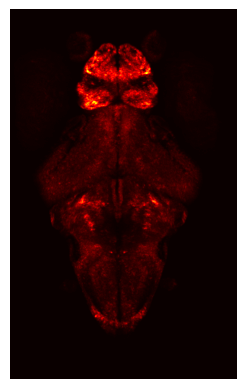

100%|███████████████████████████████████████████| 22/22 [02:37<00:00,  7.17s/it]


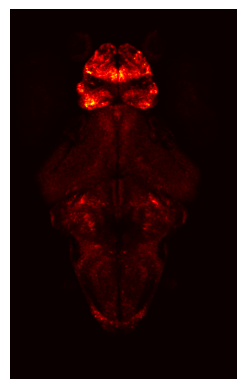

100%|███████████████████████████████████████████| 22/22 [02:53<00:00,  7.88s/it]


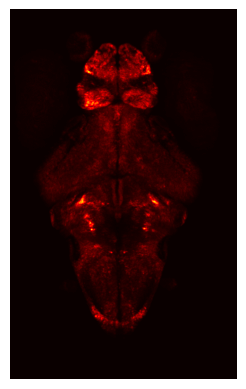

100%|███████████████████████████████████████████| 22/22 [02:42<00:00,  7.38s/it]


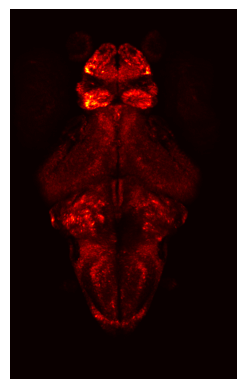

100%|███████████████████████████████████████████| 22/22 [02:43<00:00,  7.42s/it]


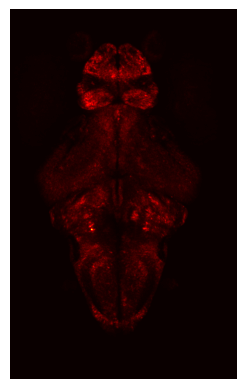

100%|███████████████████████████████████████████| 22/22 [02:41<00:00,  7.36s/it]


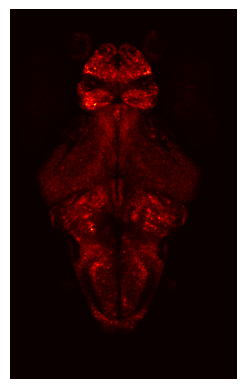

100%|███████████████████████████████████████████| 22/22 [02:40<00:00,  7.32s/it]


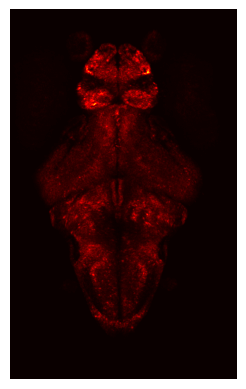

100%|███████████████████████████████████████████| 22/22 [02:43<00:00,  7.43s/it]


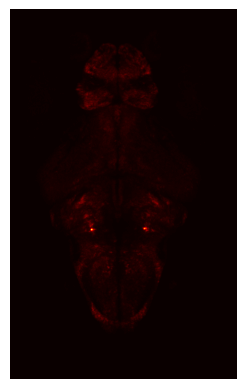

100%|███████████████████████████████████████████| 22/22 [02:49<00:00,  7.71s/it]


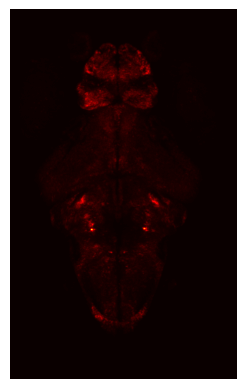

100%|███████████████████████████████████████████| 22/22 [02:50<00:00,  7.75s/it]


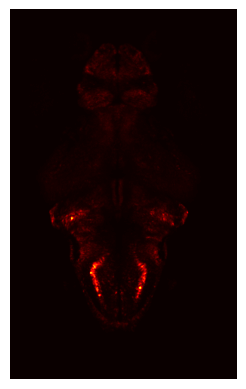

100%|███████████████████████████████████████████| 22/22 [02:53<00:00,  7.87s/it]


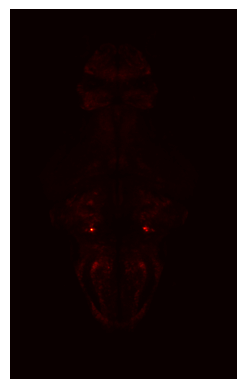

100%|███████████████████████████████████████████| 22/22 [02:54<00:00,  7.95s/it]


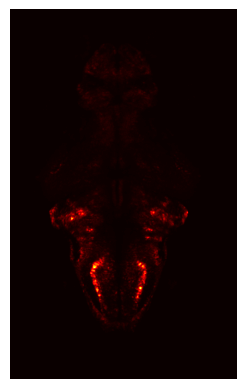

100%|███████████████████████████████████████████| 22/22 [02:53<00:00,  7.90s/it]


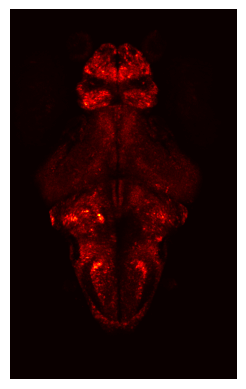

100%|███████████████████████████████████████████| 22/22 [02:54<00:00,  7.92s/it]


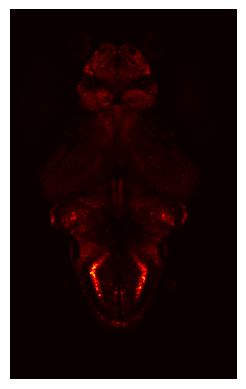

100%|███████████████████████████████████████████| 22/22 [02:54<00:00,  7.95s/it]


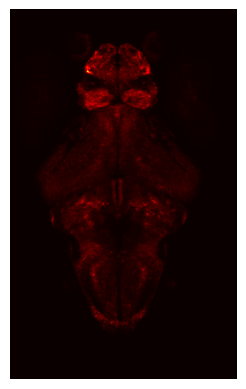

100%|███████████████████████████████████████████| 22/22 [02:58<00:00,  8.12s/it]


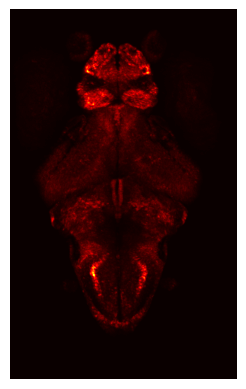

100%|███████████████████████████████████████████| 22/22 [02:57<00:00,  8.07s/it]


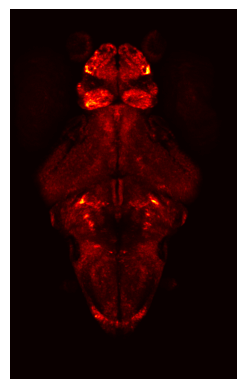

100%|███████████████████████████████████████████| 22/22 [03:02<00:00,  8.29s/it]


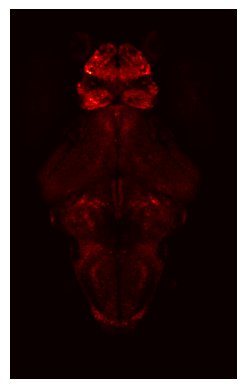

100%|███████████████████████████████████████████| 22/22 [03:07<00:00,  8.51s/it]


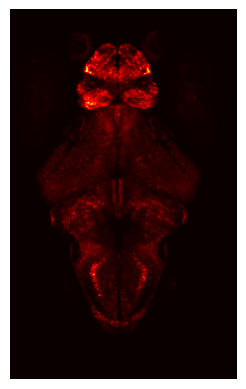

100%|███████████████████████████████████████████| 22/22 [03:09<00:00,  8.60s/it]


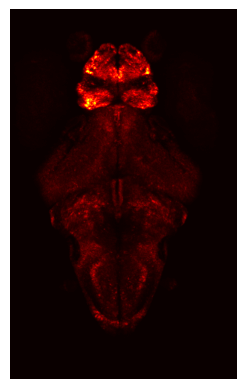

In [88]:
for c in np.unique(clusters):

    directory = cluster_paths[c - 1]
    files = identify_files(directory, ['atlas', '.nrrd'])
    stack = np.zeros(shape).astype('float')
    for i in tqdm(range(len(files)), file=sys.stdout):
        new_stack, header = load_stack(directory + files[i])
        stack = (i / (i + 1)) * stack + (1 / (i + 1)) * new_stack.astype('float') # Running average
    
    save_stack(directory + 'average.nrrd', stack, header)
    
    plt.imshow(np.max(stack ** 3, axis=0), cmap='hot')
    plt.axis('off')
    plt.show()

# Extracting forebrain independent component

Finally, we use ICA to uncover an independent forebrain activity component.

In [42]:
from sklearn.decomposition import FastICA

In [57]:
ICA = FastICA(n_components=6, whiten='unit-variance', max_iter=100000, random_state=42)
components = ICA.fit_transform(state_matrix).T

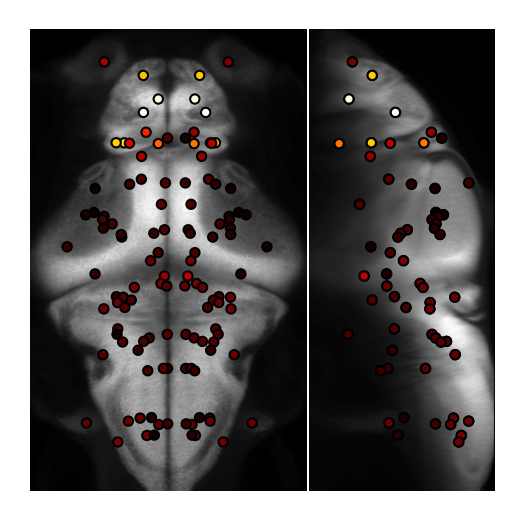

Independent component 0


In [58]:
i = 0
fig, ax = plt.subplots(figsize=(5, 5))
plot_regional_values(-components[i], atlas, excluded=excluded, cmap='hot')
print(f'Independent component {i}')
%matplotlib inline

In [59]:
forebrain_ts = -ICA.mixing_.T[0]

(4000.0, 6000.0)

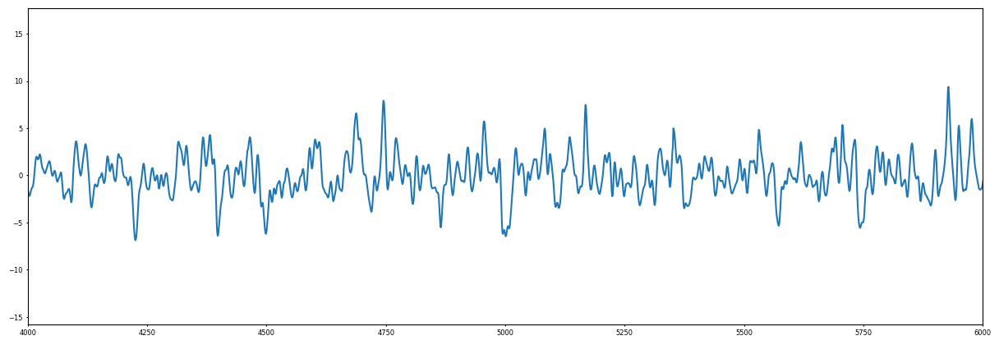

In [60]:
plt.figure(figsize=(15, 5))
plt.plot(forebrain_ts)
#plt.plot(forebrain_ts > np.percentile(forebrain_ts, 95))
plt.xlim([4000, 6000])

We can sort frames by the temporal profile of the component, and select the 95th percentile of forebrain active frames.

([], [])

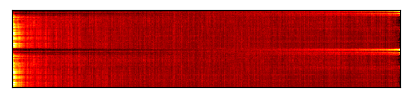

In [61]:
plt.figure(figsize=(5, 1))
plt.imshow(state_matrix[:, np.argsort(forebrain_ts)], aspect='auto', cmap='hot', vmin=-1, vmax=3)
plt.xticks([])
plt.yticks([])

In [62]:
forebrain_active = np.mean(state_matrix[:, forebrain_ts > np.percentile(forebrain_ts, 95)], axis=1)

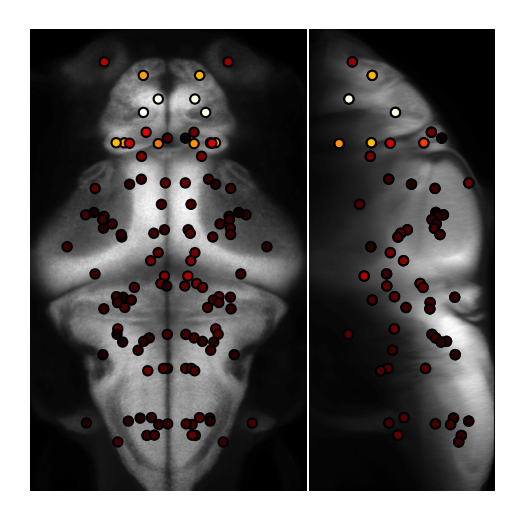

In [69]:
fig, ax = plt.subplots(figsize=(5, 5))
plot_regional_values(forebrain_active, atlas, excluded=excluded, cmap='hot')
%matplotlib inline

In [66]:
np.save('Results/figure4_forebrain_active.npy', forebrain_active)

In [68]:
plt.figure(figsize=(5, 5))
plt.scatter(forebrain_active, components[0])
plt.xlabel('Forebrain activity')
plt.ylabel('Forebrain IC')

Text(0, 0.5, 'Forebrain IC')

Computing spatial surrogates of the averaged forebrain activity.

In [70]:
compute = True

if compute:
    base = Base(x=forebrain_active, D=distances, resample=True)
    surrogates = []
    for _ in tqdm(range(10000), file=sys.stdout):
        surrogates.append(base(n=1))
    np.save('Results/figure4_surrogates_forebrain_active.npy', surrogates)

100%|█████████████████████████████████████| 10000/10000 [08:59<00:00, 18.55it/s]


# Modularity of forebrain state

As a final validation, we evaluate the significance of the forebrain modularity.

In [41]:
centroids = np.concatenate([atlas.regionCentroids['left'], atlas.regionCentroids['right']], axis=0)
centroids[:, 1] = 974 - centroids[:, 1]

centroids = np.delete(centroids, excluded, axis=0)
distances = compute_distances(centroids)

In [42]:
coassignment_matrix_SC = np.load('Results/coassignment_matrix_SC_expanded.npy')

Z = linkage(1 - coassignment_matrix_SC, 'average')
ids_Z = np.flip(leaves_list(Z)).astype('int')
communities = reorder_clusters_anteroposterior(fcluster(Z, t=5, criterion='maxclust'))
communities = np.delete(double(communities), excluded)

In [46]:
np.save('Results/figure4_consensus_communities_5_SC.npy', communities)

In [47]:
state = forebrain_active

In [48]:
R = state_matrix.shape[0]
cap = state.reshape(R, 1) @ state.reshape(1, R)

0.32599514434214755


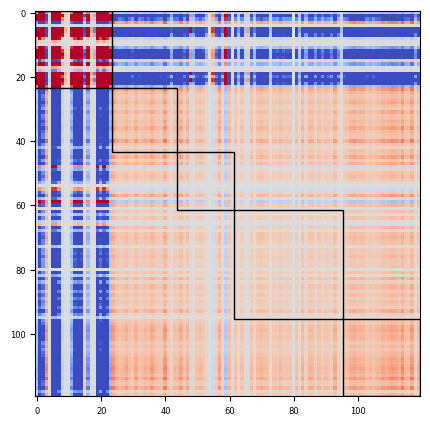

In [65]:
fig, ax = plt.subplots(figsize=(5, 5))
v = np.percentile(np.abs(cap), 95)
print(v)
plot_matrix_communities(ax, cap, communities, vmin=-v/2, vmax=v/2, cmap='coolwarm', edgecolor='black')

In [50]:
coactivations = compute_mean_coactivation_per_module(state, communities)
coactivations_null = compute_mean_coactivation_per_module_null(state, distances, communities, n_surrogates=1000)

In [51]:
coactivations_shuffled = []
communities_shuffled = np.copy(communities)
for _ in range(10000):
    np.random.shuffle(communities_shuffled)
    mean = compute_mean_coactivation_per_module(state, communities_shuffled)
    coactivations_shuffled.append(mean)

In [52]:
max_coactivations_null = np.max(coactivations_null, axis=1)
max_coactivations_shuffled = np.max(np.array(coactivations_shuffled), axis=1)

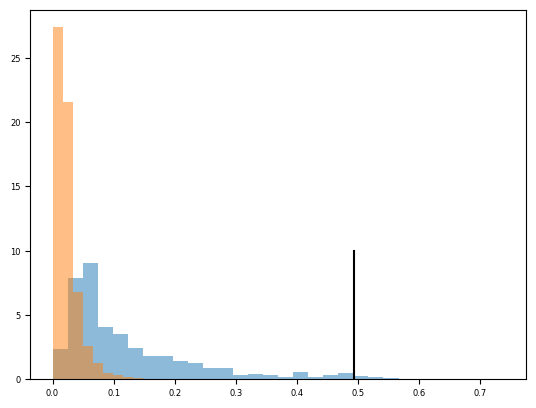

In [53]:
plt.hist(max_coactivations_null, bins=30, density=True, alpha=0.5)
plt.hist(max_coactivations_shuffled, bins=30, density=True, alpha=0.5)
plt.plot([np.max(coactivations), np.max(coactivations)], [0, 10], color='black')
plt.show()

In [60]:
np.max(coactivations)

0.49342247795582367

In [54]:
np.save('Results/figure4_nulldist1_forebrain.npy', max_coactivations_null)
np.save('Results/figure4_nulldist2_forebrain.npy', max_coactivations_shuffled)
np.save('Results/figure4_empirical_forebrain.npy', np.max(coactivations))

# Rendering 95th percentile of forebrain active

We finish by projecting the forebrain frames into the brain atlas and averaging across fish to yield a forebrain activity volume.

In [104]:
forebrain_active_vector = forebrain_ts > np.percentile(forebrain_ts, 95)

In [84]:
reg_piezo_folders, reg_stack_folders = get_registration_folders(top_directory)

In [85]:
path_ANTs = '/home/anleg84/Documents/ANTs/bin/'
os.environ["PATH"] += os.pathsep + path_ANTs

In [105]:
directory = '/media/anleg84/Backup Plus/CERVO/Data/Networks2024/Clusters-Mapzebrain/Forebrain/'

for fish in tqdm(np.unique(fish_ids), file=sys.stdout):

    #print('Fish {}'.format(fish))
    nrrd_header = load_stack(reg_piezo_folders[fish] + 'piezo.nrrd')[1]

    #print('Loading volumes...')
    frame_ids = np.where(forebrain_active_vector[fish_ids == fish])[0]
    if np.any(frame_ids):
        folder = datasets[fish]
        file = identify_files(folder, ['piezo', '.nrrd'])[0]
        piezo_stack = load_stack(folder + file)[0].astype('float')
        volumes = load_volumes(folder, frame_ids, keywords=['dff_corrected_', '.tif'], exclude=[])
        
    save_stack(directory + 'fish{}.nrrd'.format(fish), np.mean(volumes, axis=0), nrrd_header)
    
    os.chdir(directory)

    #print('Transforming into brain atlas...')

    file_in = 'fish{}.nrrd'.format(fish)
    file_out = 'fish{}_stack.nrrd'.format(fish)
    path_to_transforms = reg_piezo_folders[fish]
    path_to_transforms = os.path.relpath(path_to_transforms, directory) + '/'
    
    os.system('antsApplyTransforms -d 3 --interpolation Linear -i {0} -o {1} -r {2}stack.nrrd -t {2}1Warp.nii.gz -t {2}0GenericAffine.mat'.format(
                    file_in, file_out, path_to_transforms))
    
    file_in = 'fish{}_stack.nrrd'.format(fish)
    file_out = 'fish{}_atlas.nrrd'.format(fish) 
    path_to_transforms = reg_stack_folders[fish]
    path_to_transforms = os.path.relpath(path_to_transforms, directory) + '/'
    
    os.system('antsApplyTransforms -d 3 --interpolation Linear -i {0} -o {1} -r {2}atlas.nrrd -t {2}1Warp.nii.gz -t {2}0GenericAffine.mat'.format(
                    file_in, file_out, path_to_transforms))
    
    os.remove(directory + 'fish{}.nrrd'.format(fish))
    os.remove(directory + 'fish{}_stack.nrrd'.format(fish))

    #print('Done!')

100%|███████████████████████████████████████████| 22/22 [19:04<00:00, 52.02s/it]


In [106]:
shape = (180, 974, 597)

100%|███████████████████████████████████████████| 22/22 [02:11<00:00,  5.98s/it]


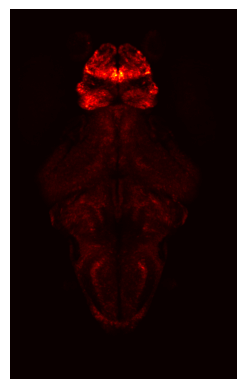

In [107]:
files = identify_files(directory, ['atlas', '.nrrd'])
stack = np.zeros(shape).astype('float')
for i in tqdm(range(len(files)), file=sys.stdout):
    new_stack, header = load_stack(directory + files[i])
    stack = (i / (i + 1)) * stack + (1 / (i + 1)) * new_stack.astype('float') # Running average

save_stack(directory + 'average.nrrd', stack, header)

plt.imshow(np.max(stack ** 3, axis=0), cmap='hot')
plt.axis('off')
plt.show()